Sentinel 2A Sample Wildfire

Bounding box dell'incendio: (7.018145062106884, 45.141455285088476, 7.16662078747616, 45.19112210703416)
Centro approssimato: POINT (7.094738178637225 45.16357809084647)
Data dell'incendio: 2017-10-22
Intervallo di ricerca: 2017-10-22/2017-10-27
Trovate 3 immagini.
Immagine 1: acquisita il 2017-10-27
Immagine salvata: sentinel_images\fire_5440\fire_5440_2017-10-27.png


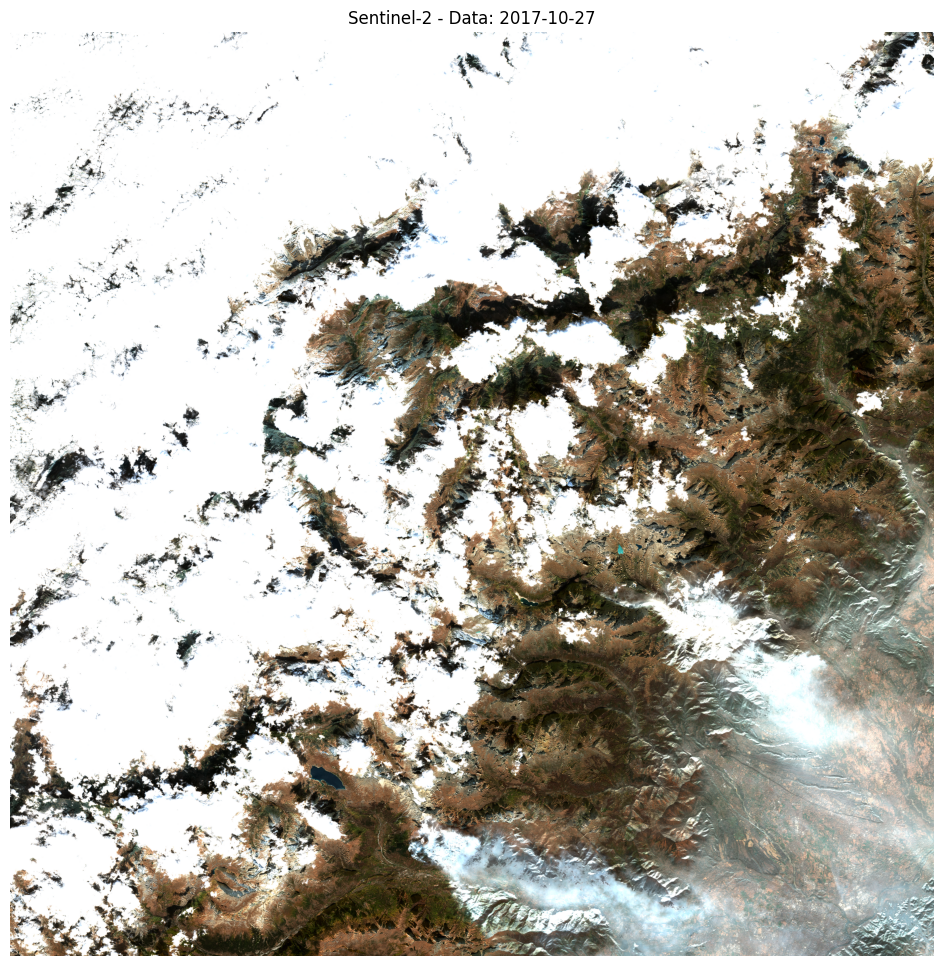

Immagine 2: acquisita il 2017-10-24
Immagine salvata: sentinel_images\fire_5440\fire_5440_2017-10-24.png


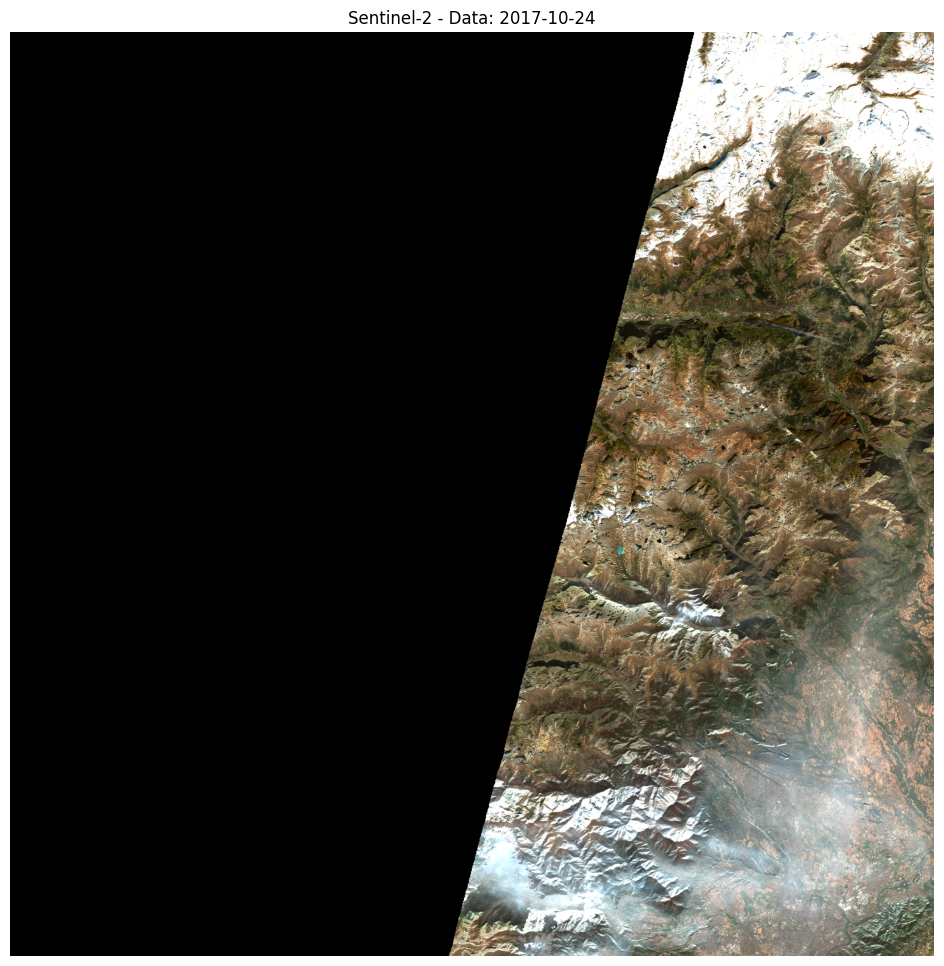

Immagine 3: acquisita il 2017-10-22
Immagine salvata: sentinel_images\fire_5440\fire_5440_2017-10-22.png


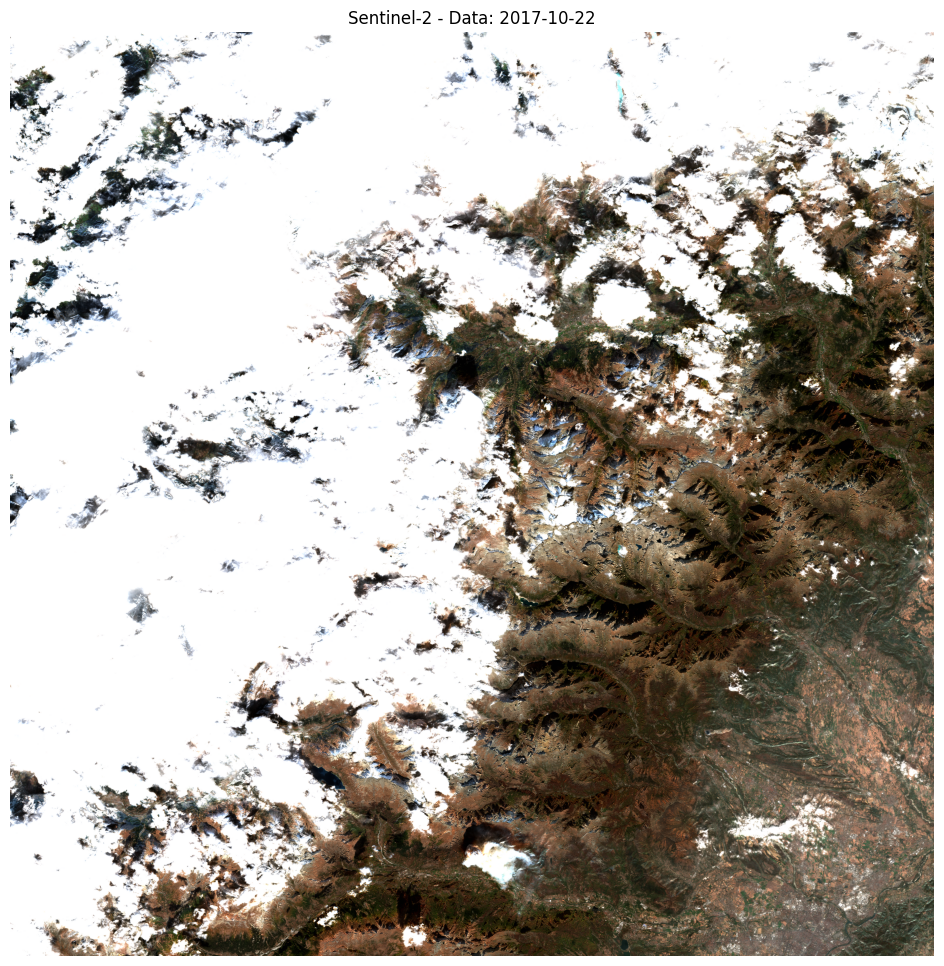

In [2]:
import planetary_computer
import pystac_client
import geopandas as gpd
from shapely.geometry import shape
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import pandas as pd
import os

GEOJSON_PATH = "shp_cp_2012_2024/piedmont_2012_2024_fa.geojson"
FIRE_ID = 5440 
SAVE_FOLDER = os.path.join("sentinel_images", f"fire_{FIRE_ID}")  
os.makedirs(SAVE_FOLDER, exist_ok=True)


gdf = gpd.read_file(GEOJSON_PATH)


fire = gdf[gdf["id"] == FIRE_ID].iloc[0]
fire_date = pd.to_datetime(fire["initialdate"])  
fire_geometry = shape(fire["geometry"])  
buffer_distance = 0.01  #Buffer 1 km
fire_geometry_buffered = fire_geometry.buffer(buffer_distance)
#Conversion
if gdf.crs and gdf.crs.to_epsg() != 4326:
    gdf = gdf.to_crs(epsg=4326)
    fire_geometry_buffered = gpd.GeoSeries([fire_geometry_buffered], crs="EPSG:3857").to_crs(epsg=4326).iloc[0]
    fire_geometry = gpd.GeoSeries([fire_geometry], crs="EPSG:3857").to_crs(epsg=4326).iloc[0]



catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace
)

#Date Interval
time_range = f"{fire_date.strftime('%Y-%m-%d')}/{(fire_date + timedelta(days=5)).strftime('%Y-%m-%d')}"
print("Bounding box dell'incendio:", fire_geometry.bounds)
print("Centro approssimato:", fire_geometry.centroid)
print("Data dell'incendio:", fire_date.strftime('%Y-%m-%d'))
print("Intervallo di ricerca:", time_range)

#Sentinel2 Query
search = catalog.search(
    collections=["sentinel-2-l2a"],
    intersects=fire_geometry_buffered,
    datetime=time_range,
)
items = list(search.items())

if not items:
    print("Nessuna immagine trovata per questo incendio.")
else:
    print(f"Trovate {len(items)} immagini.")

    for i, item in enumerate(items):
        date = item.datetime.strftime('%Y-%m-%d')
        print(f"Immagine {i+1}: acquisita il {date}")

        #visual(RGB)
        signed_href = planetary_computer.sign(item.assets["visual"]).href

        
        with rasterio.open(signed_href) as src:
            img = src.read([1, 2, 3])  # Bande RGB
            img = np.moveaxis(img, 0, -1)  # Reorder per Matplotlib

        plt.figure(figsize=(12, 12))  
        plt.imshow(img)
        plt.title(f"Sentinel-2 - Data: {date}")
        plt.axis("off")
        
        save_path = os.path.join(SAVE_FOLDER, f"fire_{FIRE_ID}_{date}.png")
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        print(f"Immagine salvata: {save_path}")
        
        plt.show()

Sentinel 2 Swapping RGB with other bands

In [4]:
import planetary_computer
import pystac_client
import geopandas as gpd
from shapely.geometry import shape
import rasterio
from rasterio.enums import Resampling
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import pandas as pd
import os

# ---------------------
# Parametri di input
# ---------------------
GEOJSON_PATH = "shp_cp_2012_2024/piedmont_2012_2024_fa.geojson"
FIRE_ID = 5440
SAVE_FOLDER = os.path.join("sentinel_images", f"fire_{FIRE_ID}")
os.makedirs(SAVE_FOLDER, exist_ok=True)

# ---------------------
# Lettura e pre-processing
# ---------------------
gdf = gpd.read_file(GEOJSON_PATH)
fire = gdf[gdf["id"] == FIRE_ID].iloc[0]
fire_date = pd.to_datetime(fire["initialdate"])
fire_geometry = shape(fire["geometry"])
buffer_distance = 0.01  # ~1 km di buffer (in coordinate geografiche)
fire_geometry_buffered = fire_geometry.buffer(buffer_distance)

# Se il layer non è in EPSG:4326, riconverti
if gdf.crs and gdf.crs.to_epsg() != 4326:
    gdf = gdf.to_crs(epsg=4326)
    fire_geometry_buffered = gpd.GeoSeries([fire_geometry_buffered], crs="EPSG:3857").to_crs(epsg=4326).iloc[0]
    fire_geometry = gpd.GeoSeries([fire_geometry], crs="EPSG:3857").to_crs(epsg=4326).iloc[0]

# ---------------------
# Apertura del catalogo
# ---------------------
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace
)

# ---------------------
# Intervallo di date
# ---------------------
time_range = f"{fire_date.strftime('%Y-%m-%d')}/{(fire_date + timedelta(days=3)).strftime('%Y-%m-%d')}"
print("Bounding box dell'incendio:", fire_geometry.bounds)
print("Centro approssimato:", fire_geometry.centroid)
print("Data dell'incendio:", fire_date.strftime('%Y-%m-%d'))
print("Intervallo di ricerca:", time_range)

# ---------------------
# Ricerca di Sentinel-2
# ---------------------
search = catalog.search(
    collections=["sentinel-2-l2a"],
    intersects=fire_geometry_buffered,
    datetime=time_range,
)
items = list(search.items())

if not items:
    print("Nessuna immagine trovata per questo incendio.")
else:
    print(f"Trovate {len(items)} immagini.")

    # Definizione di tutte le bande Sentinel-2 e delle loro risoluzioni native
    sentinel2_bands = {
        # 10m bands
        "B02": 10, "B03": 10, "B04": 10, "B08": 10,
        # 20m bands
        "B05": 20, "B06": 20, "B07": 20, "B8A": 20, "B11": 20, "B12": 20,
        # 60m bands
        "B01": 60, "B09": 60
    }
    
    # B10 è esclusa perché non esiste in Sentinel-2

    # Funzione di resampling per ridimensionare la banda alla risoluzione di 10m
    def resample_band(src, target_resolution=10):
        # Calcola il fattore di ridimensionamento in base alla risoluzione
        scale_x = src.transform[0] / target_resolution
        scale_y = -src.transform[4] / target_resolution

        # Resampling della banda alla risoluzione target
        band_data_resampled = src.read(
            1, resampling=Resampling.bilinear, out_shape=(
                int(src.height * scale_y),
                int(src.width * scale_x)
            )
        )

        # Ritorna i dati della banda resampled
        return band_data_resampled

    for i, item in enumerate(items):
        date = item.datetime.strftime('%Y-%m-%d')
        print(f"\nImmagine {i+1}: acquisita il {date}")

        band_arrays_resampled = []  # Lista per le bande resampled
        band_names_resampled = []   # Lista per i nomi delle bande
        profile = None  # Variabile per memorizzare il profilo di riferimento a 10m

        # Otteniamo prima le bande a 10m per utilizzarne le dimensioni come riferimento
        reference_band = None
        for band, resolution in sentinel2_bands.items():
            if resolution == 10 and band in item.assets:
                reference_band = band
                break

        if reference_band is None:
            print("Nessuna banda a 10m disponibile per questo item. Impossibile procedere.")
            continue

        # Per ciascuna banda, leggiamo i dati e li resample alla risoluzione di 10m
        for band, native_resolution in sentinel2_bands.items():
            if band in item.assets:
                signed_href = planetary_computer.sign(item.assets[band]).href
                with rasterio.open(signed_href) as src:
                    # Se la banda ha risoluzione diversa da 10m, la risempliamo a 10m
                    if native_resolution != 10:
                        band_data_resampled = resample_band(src, target_resolution=10)
                    else:
                        band_data_resampled = src.read(1).astype(np.float32)
                        # Impostiamo il profilo di riferimento usando una banda a 10m
                        if profile is None:
                            profile = src.profile.copy()
                    
                    band_arrays_resampled.append(band_data_resampled)
                    band_names_resampled.append(band)
                    print(f"  -> Banda {band} caricata" + 
                          (f" e resampling da {native_resolution}m a 10m (bilinear)." if native_resolution != 10 else "."))
            else:
                print(f"  -> Banda {band} non disponibile per questo item.")

        if not band_arrays_resampled or profile is None:
            print("Insufficienti dati disponibili per costruire il data cube.")
            continue

        # Aggiorniamo il profilo per il file multi-banda
        profile.update(count=len(band_arrays_resampled))  # Aggiorniamo il numero di bande

        # Convertiamo la lista in un array numpy con shape (num_bande, height, width)
        data_cube = np.stack(band_arrays_resampled, axis=0)

        # Salviamo il data cube in un file GeoTIFF multi-banda
        cube_path = os.path.join(SAVE_FOLDER, f"fire_{FIRE_ID}_{date}_allbands_10m.tif")
        with rasterio.open(cube_path, "w", **profile) as dst:
            dst.write(data_cube)
            # Opzionalmente, aggiungiamo i nomi delle bande come metadati
            dst.descriptions = band_names_resampled
        
        print(f"Data cube con {len(band_names_resampled)} bande salvato in: {cube_path}")
        print(f"Bande incluse: {', '.join(band_names_resampled)}")

Bounding box dell'incendio: (7.018145062106884, 45.141455285088476, 7.16662078747616, 45.19112210703416)
Centro approssimato: POINT (7.094738178637225 45.16357809084647)
Data dell'incendio: 2017-10-22
Intervallo di ricerca: 2017-10-22/2017-10-25
Trovate 2 immagini.

Immagine 1: acquisita il 2017-10-24
  -> Banda B02 caricata.
  -> Banda B03 caricata.
  -> Banda B04 caricata.
  -> Banda B08 caricata.
  -> Banda B05 caricata e resampling da 20m a 10m (bilinear).
  -> Banda B06 caricata e resampling da 20m a 10m (bilinear).
  -> Banda B07 caricata e resampling da 20m a 10m (bilinear).
  -> Banda B8A caricata e resampling da 20m a 10m (bilinear).
  -> Banda B11 caricata e resampling da 20m a 10m (bilinear).
  -> Banda B12 caricata e resampling da 20m a 10m (bilinear).
  -> Banda B01 caricata e resampling da 60m a 10m (bilinear).
  -> Banda B09 caricata e resampling da 60m a 10m (bilinear).


MemoryError: Unable to allocate 5.39 GiB for an array with shape (12, 10980, 10980) and data type float32

ONLY 3 BANDS

In [5]:
import planetary_computer
import pystac_client
import geopandas as gpd
from shapely.geometry import shape
import rasterio
from rasterio.enums import Resampling
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import pandas as pd
import os

# ---------------------
# Parametri di input
# ---------------------
GEOJSON_PATH = "shp_cp_2012_2024/piedmont_2012_2024_fa.geojson"
FIRE_ID = 5440
SAVE_FOLDER = os.path.join("sentinel_images", f"fire_{FIRE_ID}")
os.makedirs(SAVE_FOLDER, exist_ok=True)
SCALE_FACTOR = 4  # Riduzione dimensioni per visualizzazione
DPI = 150  # Risoluzione immagine finale

# ---------------------
# Lettura e pre-processing
# ---------------------
gdf = gpd.read_file(GEOJSON_PATH)
fire = gdf[gdf["id"] == FIRE_ID].iloc[0]
fire_date = pd.to_datetime(fire["initialdate"])
fire_geometry = shape(fire["geometry"])
buffer_distance = 0.01  # ~1 km di buffer (in coordinate geografiche)
fire_geometry_buffered = fire_geometry.buffer(buffer_distance)

# Se il layer non è in EPSG:4326, riconverti
if gdf.crs and gdf.crs.to_epsg() != 4326:
    gdf = gdf.to_crs(epsg=4326)
    fire_geometry_buffered = gpd.GeoSeries([fire_geometry_buffered], crs="EPSG:3857").to_crs(epsg=4326).iloc[0]
    fire_geometry = gpd.GeoSeries([fire_geometry], crs="EPSG:3857").to_crs(epsg=4326).iloc[0]

# ---------------------
# Apertura del catalogo
# ---------------------
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace
)

# ---------------------
# Intervallo di date
# ---------------------
time_range = f"{fire_date.strftime('%Y-%m-%d')}/{(fire_date + timedelta(days=3)).strftime('%Y-%m-%d')}"
print("Bounding box dell'incendio:", fire_geometry.bounds)
print("Centro approssimato:", fire_geometry.centroid)
print("Data dell'incendio:", fire_date.strftime('%Y-%m-%d'))
print("Intervallo di ricerca:", time_range)

# ---------------------
# Ricerca di Sentinel-2
# ---------------------
search = catalog.search(
    collections=["sentinel-2-l2a"],
    intersects=fire_geometry_buffered,
    datetime=time_range,
)
items = list(search.items())

if not items:
    print("Nessuna immagine trovata per questo incendio.")
else:
    print(f"Trovate {len(items)} immagini.")

    # Definizione di tutte le bande Sentinel-2 e delle loro risoluzioni native
    sentinel2_bands = {
        "B04": 10, "B08": 10,
        "B12": 20,
    }
    
    # B10 è esclusa perché non esiste in Sentinel-2

    # Funzione di resampling per ridimensionare la banda alla risoluzione di 10m
    def resample_band(src, target_resolution=10):
        # Calcola il fattore di ridimensionamento in base alla risoluzione
        scale_x = src.transform[0] / target_resolution
        scale_y = -src.transform[4] / target_resolution

        # Resampling della banda alla risoluzione target
        band_data_resampled = src.read(
            1, resampling=Resampling.bilinear, out_shape=(
                int(src.height * scale_y),
                int(src.width * scale_x)
            )
        )

        # Ritorna i dati della banda resampled
        return band_data_resampled

    for i, item in enumerate(items):
        date = item.datetime.strftime('%Y-%m-%d')
        print(f"\nImmagine {i+1}: acquisita il {date}")

        band_arrays_resampled = []  # Lista per le bande resampled
        band_names_resampled = []   # Lista per i nomi delle bande
        profile = None  # Variabile per memorizzare il profilo di riferimento a 10m

        # Otteniamo prima le bande a 10m per utilizzarne le dimensioni come riferimento
        reference_band = None
        for band, resolution in sentinel2_bands.items():
            if resolution == 10 and band in item.assets:
                reference_band = band
                break

        if reference_band is None:
            print("Nessuna banda a 10m disponibile per questo item. Impossibile procedere.")
            continue

        # Per ciascuna banda, leggiamo i dati e li resample alla risoluzione di 10m
        for band, native_resolution in sentinel2_bands.items():
            if band in item.assets:
                signed_href = planetary_computer.sign(item.assets[band]).href
                with rasterio.open(signed_href) as src:
                    # Se la banda ha risoluzione diversa da 10m, la risempliamo a 10m
                    if native_resolution != 10:
                        band_data_resampled = resample_band(src, target_resolution=10)
                    else:
                        band_data_resampled = src.read(1).astype(np.float32)
                        # Impostiamo il profilo di riferimento usando una banda a 10m
                        if profile is None:
                            profile = src.profile.copy()
                    
                    band_arrays_resampled.append(band_data_resampled)
                    band_names_resampled.append(band)
                    print(f"  -> Banda {band} caricata" + 
                          (f" e resampling da {native_resolution}m a 10m (bilinear)." if native_resolution != 10 else "."))
            else:
                print(f"  -> Banda {band} non disponibile per questo item.")

        if not band_arrays_resampled or profile is None:
            print("Insufficienti dati disponibili per costruire il data cube.")
            continue

        # Aggiorniamo il profilo per il file multi-banda
        profile.update(count=len(band_arrays_resampled))  # Aggiorniamo il numero di bande

        # Convertiamo la lista in un array numpy con shape (num_bande, height, width)
        data_cube = np.stack(band_arrays_resampled, axis=0)

        # Salviamo il data cube in un file GeoTIFF multi-banda
        cube_path = os.path.join(SAVE_FOLDER, f"fire_{FIRE_ID}_{date}_fakergb_10m.tif")
        with rasterio.open(cube_path, "w", **profile) as dst:
            dst.write(data_cube)
            # Opzionalmente, aggiungiamo i nomi delle bande come metadati
            dst.descriptions = band_names_resampled
        
        print(f"Data cube con {len(band_names_resampled)} bande salvato in: {cube_path}")
        print(f"Bande incluse: {', '.join(band_names_resampled)}")

        # --------------------------------------------------
        # Parte aggiunta: Visualizzazione RGB
        # --------------------------------------------------
        with rasterio.open(cube_path) as src:
            new_height = src.height // SCALE_FACTOR
            new_width = src.width // SCALE_FACTOR
            
            b04 = src.read(1, out_shape=(new_height, new_width), resampling=Resampling.bilinear)
            b08 = src.read(2, out_shape=(new_height, new_width), resampling=Resampling.bilinear)
            b12 = src.read(3, out_shape=(new_height, new_width), resampling=Resampling.bilinear)

        def normalize_band(band):
            vmin = np.nanpercentile(band, 2)
            vmax = np.nanpercentile(band, 98)
            band_norm = np.clip((band - vmin) / (vmax - vmin), 0, 1)
            return (band_norm * 255).astype(np.uint8)

        red = normalize_band(b12)
        green = normalize_band(b08)
        blue = normalize_band(b04)

        rgb_image = np.dstack((red, green, blue))

        plt.figure(figsize=(15, 15))
        plt.imshow(rgb_image)
        plt.axis("off")
        rgb_path = os.path.join(SAVE_FOLDER, f"fire_{FIRE_ID}_{date}_RGB.png")
        plt.savefig(rgb_path, bbox_inches='tight', pad_inches=0, dpi=DPI)
        plt.close()
        print(f"Immagine RGB salvata in: {rgb_path}")

Bounding box dell'incendio: (7.018145062106884, 45.141455285088476, 7.16662078747616, 45.19112210703416)
Centro approssimato: POINT (7.094738178637225 45.16357809084647)
Data dell'incendio: 2017-10-22
Intervallo di ricerca: 2017-10-22/2017-10-25
Trovate 2 immagini.

Immagine 1: acquisita il 2017-10-24
  -> Banda B04 caricata.
  -> Banda B08 caricata.
  -> Banda B12 caricata e resampling da 20m a 10m (bilinear).
Data cube con 3 bande salvato in: sentinel_images\fire_5440\fire_5440_2017-10-24_fakergb_10m.tif
Bande incluse: B04, B08, B12
Immagine RGB salvata in: sentinel_images\fire_5440\fire_5440_2017-10-24_RGB.png

Immagine 2: acquisita il 2017-10-22
  -> Banda B04 caricata.
  -> Banda B08 caricata.
  -> Banda B12 caricata e resampling da 20m a 10m (bilinear).
Data cube con 3 bande salvato in: sentinel_images\fire_5440\fire_5440_2017-10-22_fakergb_10m.tif
Bande incluse: B04, B08, B12
Immagine RGB salvata in: sentinel_images\fire_5440\fire_5440_2017-10-22_RGB.png


Bande disponibili: ('B04', 'B08', 'B12')
Banda B04 all'indice 1
Banda B08 all'indice 2
Banda B12 all'indice 3


'plt.savefig(OUTPUT_PATH, dpi=DPI, bbox_inches=\'tight\', pad_inches=0)\nplt.close()\n\nprint(f"Immagine RGB salvata in: {OUTPUT_PATH}")\n'

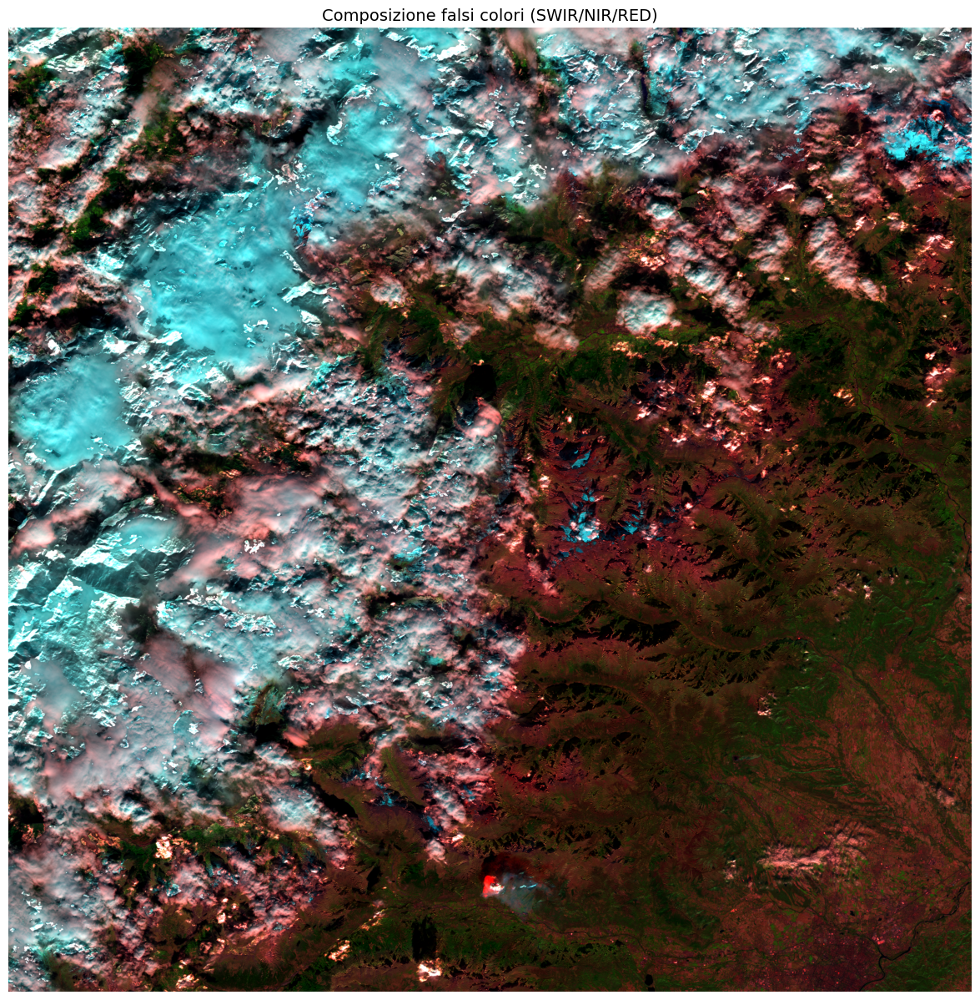

In [ ]:
import rasterio
from rasterio.enums import Resampling
import numpy as np
import matplotlib.pyplot as plt
import os

# --------------------------------------------------
# Parametri configurabili
# --------------------------------------------------
SCALE_FACTOR = 4  # Riduzione dimensioni (1 = originale, 4 = 1/4)
TIFF_PATH = "sentinel_images/fire_5440/fire_5440_2017-10-22_fakergb_10m.tif"
#OUTPUT_PATH = "fire_5440_RGB_swapped.png"
DPI = 150  # Risoluzione immagine finale

# --------------------------------------------------
# Lettura del data cube con downsampling
# --------------------------------------------------
with rasterio.open(TIFF_PATH) as src:
    # Ottieni dimensioni originali
    height, width = src.shape
    
    # Calcola nuove dimensioni
    new_height = height // SCALE_FACTOR
    new_width = width // SCALE_FACTOR
    
    # Leggi i descrittori delle bande dai metadati
    band_descriptions = src.descriptions
    print("Bande disponibili:", band_descriptions)
    
    # Trova gli indici delle bande che ci interessano (B04, B08, B12)
    b04_index = band_descriptions.index("B04") + 1  # +1 perché rasterio parte da 1
    b08_index = band_descriptions.index("B08") + 1
    b12_index = band_descriptions.index("B12") + 1
    
    print(f"Banda B04 all'indice {b04_index}")
    print(f"Banda B08 all'indice {b08_index}")
    print(f"Banda B12 all'indice {b12_index}")
    
    # Leggi le bande con downsampling                  
    b04 = src.read(b04_index, out_shape=(new_height, new_width), resampling=Resampling.bilinear)
    b08 = src.read(b08_index, out_shape=(new_height, new_width), resampling=Resampling.bilinear)
    b12 = src.read(b12_index, out_shape=(new_height, new_width), resampling=Resampling.bilinear)

# --------------------------------------------------
# Normalizzazione delle bande
# --------------------------------------------------
def normalize_band(band):
    vmin = np.nanpercentile(band, 2)  # Taglia il 2% inferiore
    vmax = np.nanpercentile(band, 98)  # Taglia il 2% superiore
    band_norm = np.clip((band - vmin) / (vmax - vmin), 0, 1)
    return (band_norm * 255).astype(np.uint8)  # Converti in uint8

# Composizione RGB "swappata" (false color)
red = normalize_band(b12)    # B12 → Rosso (SWIR)
green = normalize_band(b08)  # B08 → Verde (NIR)
blue = normalize_band(b04)   # B04 → Blu (Rosso)

# --------------------------------------------------
# Creazione e salvataggio RGB
# --------------------------------------------------
rgb_image = np.dstack((red, green, blue))

plt.figure(figsize=(15, 15))
plt.imshow(rgb_image)
plt.title("Composizione falsi colori (SWIR/NIR/RED)", fontsize=14)
plt.axis("off")

'''plt.savefig(OUTPUT_PATH, dpi=DPI, bbox_inches='tight', pad_inches=0)
plt.close()

print(f"Immagine RGB salvata in: {OUTPUT_PATH}")
'''

Bande disponibili: ('B02', 'B03', 'B04', 'B08', 'B05', 'B06', 'B07', 'B8A', 'B11', 'B12', 'B01', 'B09')
Banda B04 all'indice 3
Banda B08 all'indice 4
Banda B12 all'indice 10


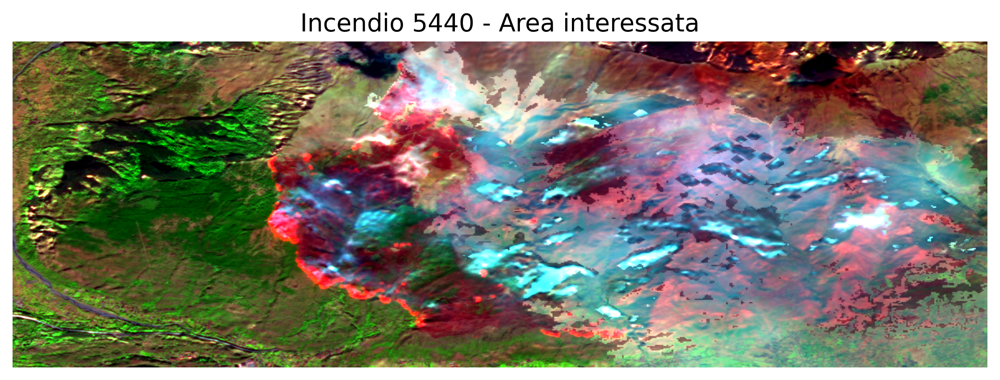

Processo completato! Immagine salvata in: sentinel_images\fire_5440\fire_5440_zoom_0.5x.png


In [ ]:
import rasterio
from rasterio.enums import Resampling
import numpy as np
import matplotlib.pyplot as plt
import os
import geopandas as gpd
from shapely.geometry import shape, box
import geopandas as gpd

# --------------------------------------------------
# Configurazione
# --------------------------------------------------
GEOJSON_PATH = "shp_cp_2012_2024/piedmont_2012_2024_fa.geojson"
FIRE_ID = 5440 
SAVE_FOLDER = os.path.join("sentinel_images", f"fire_{FIRE_ID}")
TIFF_PATH = os.path.join(SAVE_FOLDER, "fire_5440_2017-10-27_allbands_10m.tif")
SCALE_FACTOR = 0.5
DPI = 300
os.makedirs(SAVE_FOLDER, exist_ok=True)

# --------------------------------------------------
# Lettura geometria incendio
# --------------------------------------------------

gdf = gpd.read_file(GEOJSON_PATH)
fire = gdf[gdf["id"] == FIRE_ID].iloc[0]
fire_geom = shape(fire["geometry"])

# Creazione bounding box con buffer   
buffer_distance = 0.01
fire_geom_buffered = fire_geom.buffer(buffer_distance)

if gdf.crs.to_epsg() != 4326:
    original_crs = gdf.crs
    gdf = gdf.to_crs(epsg=4326)
    
    # Conversione geometria buffered
    fire_geom_buffered = gpd.GeoSeries([fire_geom_buffered], crs=original_crs)\
                           .to_crs(4326)\
                           .iloc[0]
    
    # Conversione geometria originale
    fire_geom = gpd.GeoSeries([fire_geom], crs=original_crs)\
                 .to_crs(4326)\
                 .iloc[0]

minx, miny, maxx, maxy = fire_geom_buffered.bounds
fire_bbox = box(minx, miny, maxx, maxy)


# --------------------------------------------------
# Funzione di ritaglio georeferenziato
# --------------------------------------------------
def crop_and_scale(tiff_path, bbox, scale_factor):

    with rasterio.open(TIFF_PATH) as src:
        # Conversione del bounding box al CRS dell'immagine
        bbox_transformed = gpd.GeoSeries(bbox, crs=4326).to_crs(src.crs).iloc[0]
        
        # Calcolo finestra di ritaglio
        window = rasterio.windows.from_bounds(
            *bbox_transformed.bounds, 
            transform=src.transform
        )
        
        # Leggi i descrittori delle bande dai metadati
        band_descriptions = src.descriptions
        print("Bande disponibili:", band_descriptions)
        
        # Trova gli indici delle bande che ci interessano (B04, B08, B12)
        b04_index = band_descriptions.index("B04") + 1  # +1 perché rasterio parte da 1
        b08_index = band_descriptions.index("B08") + 1
        b12_index = band_descriptions.index("B12") + 1
        
        print(f"Banda B04 all'indice {b04_index}")
        print(f"Banda B08 all'indice {b08_index}")
        print(f"Banda B12 all'indice {b12_index}")
        
        # Leggi le bande con downsampling
        b04 = src.read(b04_index, window=window,out_shape=(int(window.height // scale_factor),int(window.width // scale_factor)), resampling=Resampling.bilinear)
        b08 = src.read(b08_index, window=window, out_shape=(int(window.height // scale_factor),int(window.width // scale_factor)), resampling=Resampling.bilinear)
        b12 = src.read(b12_index, window=window, out_shape=(int(window.height // scale_factor),int (window.width // scale_factor)), resampling=Resampling.bilinear)

        return b04, b08, b12
# --------------------------------------------------
# Elaborazione e visualizzazione
# --------------------------------------------------
# Esegui ritaglio
b04, b08, b12 = crop_and_scale(TIFF_PATH, fire_bbox, SCALE_FACTOR)

# Normalizzazione
def normalize(band):
    p2, p98 = np.nanpercentile(band, [2, 98])
    return np.clip((band - p2) / (p98 - p2), 0, 1)

rgb = np.dstack((
    normalize(b12),  # SWIR -> Rosso
    normalize(b08),  # NIR -> Verde
    normalize(b04)   # Red -> Blu
))

# Creazione figura
fig, ax = plt.subplots(figsize=(10, 10), dpi=DPI)
ax.imshow(rgb, extent=[minx, maxx, miny, maxy])  # Coordinate geografiche
ax.set_title(f"Incendio {FIRE_ID} - Area interessata", fontsize=14)
ax.axis('off')

# Salvataggio
output_path = os.path.join(SAVE_FOLDER, f"fire_{FIRE_ID}_zoom_{SCALE_FACTOR}x.png")
plt.savefig(output_path, bbox_inches='tight', pad_inches=0, dpi=DPI)

# Visualizzazione diretta
plt.show()
plt.close()

print(f"Processo completato! Immagine salvata in: {output_path}")

Sentinel2 Crop

Trovate 3 immagini.
Immagine 1: acquisita il 2017-10-27
Raster bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
Fire bounds: (7.018145062106884, 45.141455285088476, 7.16662078747616, 45.19112210703416)
Immagine salvata: sentinel_images\fire_5440\fire_5440_2017-10-27_crop.png


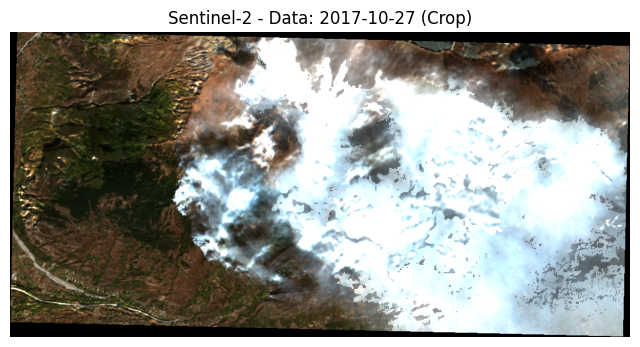

Immagine 2: acquisita il 2017-10-24
Raster bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
Fire bounds: (7.018145062106884, 45.141455285088476, 7.16662078747616, 45.19112210703416)
Immagine salvata: sentinel_images\fire_5440\fire_5440_2017-10-24_crop.png


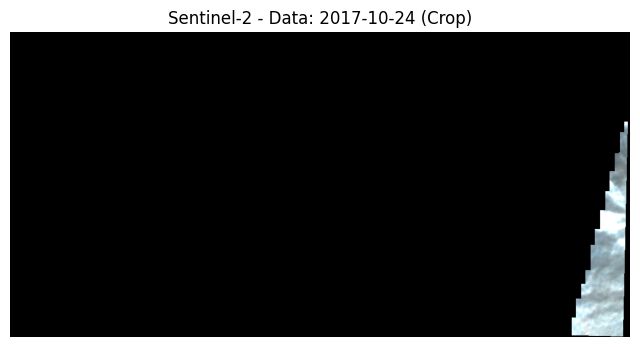

Immagine 3: acquisita il 2017-10-22
Raster bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
Fire bounds: (7.018145062106884, 45.141455285088476, 7.16662078747616, 45.19112210703416)
Immagine salvata: sentinel_images\fire_5440\fire_5440_2017-10-22_crop.png


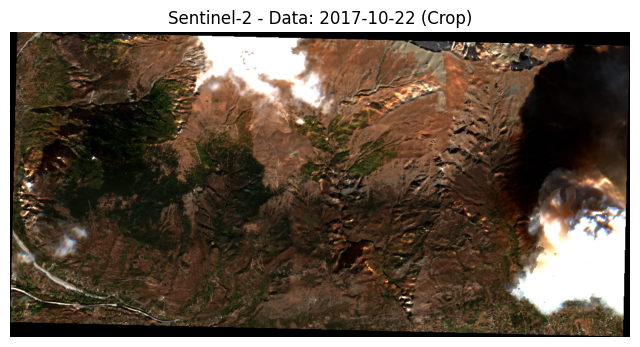

In [ ]:
import planetary_computer
import pystac_client
import geopandas as gpd
from shapely.geometry import shape,box
import rasterio
import rasterio.mask
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import pandas as pd
import os


GEOJSON_PATH = "shp_cp_2012_2024/piedmont_2012_2024_fa.geojson"
FIRE_ID = 5440 
SAVE_FOLDER = os.path.join("sentinel_images", f"fire_{FIRE_ID}")  
os.makedirs(SAVE_FOLDER, exist_ok=True)


gdf = gpd.read_file(GEOJSON_PATH)

fire = gdf[gdf["id"] == FIRE_ID].iloc[0]
fire_date = pd.to_datetime(fire["initialdate"]) 
fire_geometry = shape(fire["geometry"])  
buffer_distance = 0.01  #Buffer
fire_geometry_buffered = fire_geometry.buffer(buffer_distance)
#Conversion
if gdf.crs and gdf.crs.to_epsg() != 4326:
    gdf = gdf.to_crs(epsg=4326)
    fire_geometry_buffered = gpd.GeoSeries([fire_geometry_buffered], crs="EPSG:3857").to_crs(epsg=4326).iloc[0]
    fire_geometry = gpd.GeoSeries([fire_geometry], crs="EPSG:3857").to_crs(epsg=4326).iloc[0]

#Crop Bouding Box
minx, miny, maxx, maxy = fire_geometry_buffered.bounds
fire_bbox = box(minx, miny, maxx, maxy)

catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace
)

time_range = f"{fire_date.strftime('%Y-%m-%d')}/{(fire_date + timedelta(days=5)).strftime('%Y-%m-%d')}"

search = catalog.search(
    collections=["sentinel-2-l2a"],
    intersects=fire_geometry_buffered,  
    datetime=time_range,
)
items = list(search.items())

if not items:
    print("Nessuna immagine trovata per questo incendio.")
else:
    print(f"Trovate {len(items)} immagini.")
    
    for i, item in enumerate(items):
        date = item.datetime.strftime('%Y-%m-%d')
        print(f"Immagine {i+1}: acquisita il {date}")
        
        signed_href = planetary_computer.sign(item.assets["visual"]).href
        
        with rasterio.open(signed_href) as src:
            print("Raster bounds:", src.bounds)
            print("Fire bounds:", fire_geometry.bounds)
        
        with rasterio.open(signed_href) as src:
            
            fire_bbox_utm = gpd.GeoSeries([fire_bbox], crs="EPSG:4326").to_crs(src.crs).iloc[0]
    
            try:
                img, transform = rasterio.mask.mask(src, [fire_bbox_utm], crop=True)
                img = np.moveaxis(img, 0, -1)
            except ValueError:
                print("Errore: L'area dell'incendio non si sovrappone all'immagine Sentinel-2.")
                continue

        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        plt.title(f"Sentinel-2 - Data: {date} (Crop)")
        plt.axis("off")
        
        save_path = os.path.join(SAVE_FOLDER, f"fire_{FIRE_ID}_{date}_crop.png")
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        print(f"Immagine salvata: {save_path}")
        plt.show()


Modis Fire 8days

Bounding box WGS84 (gradi): [5.465280204388707, 43.50870065337977, 8.719675513198741, 46.87293601919697]
Bounding box MODIS CRS (metri): [527324.5574503258, 5042947.119381003, 841329.0552633735, 5347419.208799689]
Trovate 3 immagini:
[1/3] Data: 2017-11-01
(329, 339)
  → Salvato TIFF con 2 bande in modis_emissivity\fire_5440\2017-11-01_Emis_31_32.tif


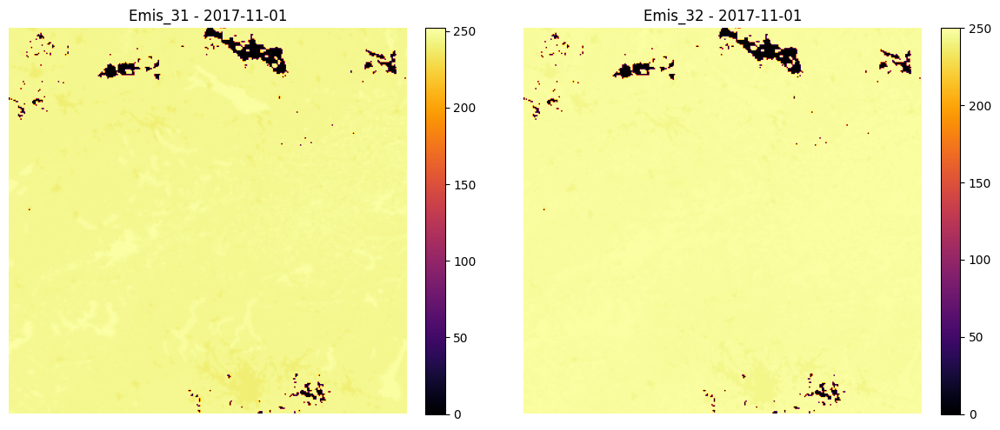

[2/3] Data: 2017-10-24
(329, 339)
  → Salvato TIFF con 2 bande in modis_emissivity\fire_5440\2017-10-24_Emis_31_32.tif


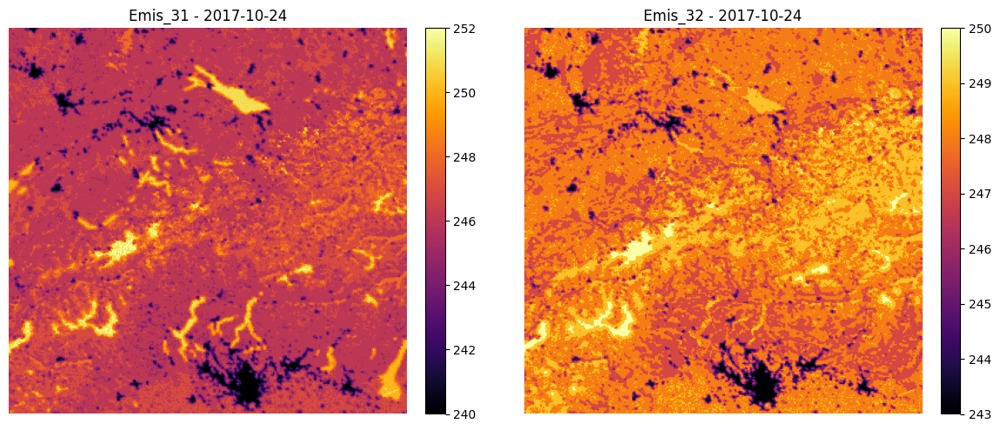

[3/3] Data: 2017-10-16
(329, 339)
  → Salvato TIFF con 2 bande in modis_emissivity\fire_5440\2017-10-16_Emis_31_32.tif


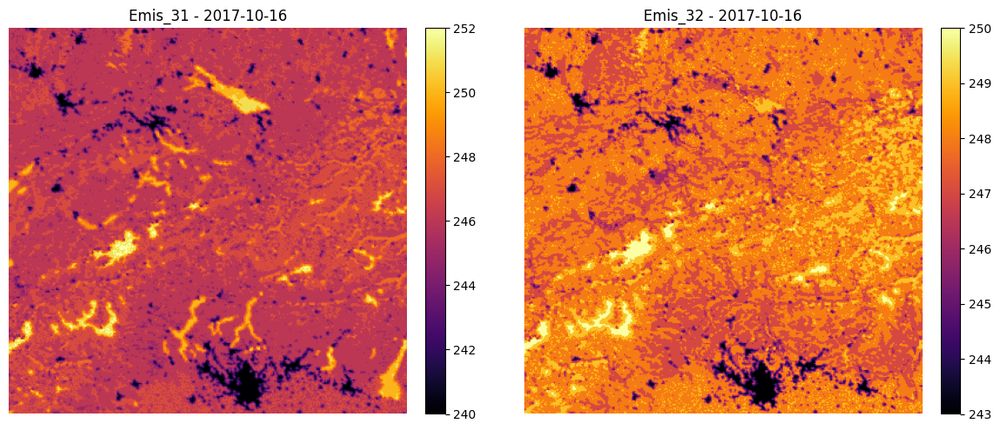

In [11]:
import planetary_computer
import pystac_client
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
from datetime import timedelta
from datetime import datetime
import pandas as pd
import os

# ========== CONFIG ==========
GEOJSON_PATH = "shp_cp_2012_2024/piedmont_2012_2024_fa.geojson"
FIRE_ID = 5440
SAVE_FOLDER = os.path.join("modis_emissivity", f"fire_{FIRE_ID}")
os.makedirs(SAVE_FOLDER, exist_ok=True)

# ========== LOAD FIRE DATA ==========
gdf = gpd.read_file(GEOJSON_PATH)
fire_feature = gdf[gdf["id"] == FIRE_ID].iloc[0]
fire_geometry = fire_feature.geometry
fire_date = pd.to_datetime(fire_feature["initialdate"])

# Reproject geometry to WGS84 and then to MODIS CRS
fire_geometry_4326 = gpd.GeoSeries([fire_geometry], crs=3857).to_crs(4326).iloc[0]
fire_geom_df = gpd.GeoSeries([fire_geometry_4326], crs=4326).to_crs("EPSG:6933")

# BUFFER GRANDE per evitare crop eccessivo (50 km)
fire_geom_buffered = fire_geom_df.buffer(150_000)

# Bounding boxes
bbox_4326 = gpd.GeoSeries(fire_geom_buffered.to_crs(4326)).total_bounds.tolist()
bbox_m = fire_geom_buffered.total_bounds.tolist()

print("Bounding box WGS84 (gradi):", bbox_4326)
print("Bounding box MODIS CRS (metri):", bbox_m)

# ========== STAC SEARCH ==========
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace
)
time_range = f"{(fire_date - timedelta(days=3)):%Y-%m-%d}/{(fire_date + timedelta(days=10)):%Y-%m-%d}"

search = catalog.search(
    collections=["modis-11A2-061"],
    bbox=bbox_4326,
    datetime=time_range,
    query={"platform": {"eq": "terra"}}
)

items = list(search.items())
print(f"Trovate {len(items)} immagini:")

# ========== DOWNLOAD, SALVA, PLOT ==========
for i, item in enumerate(items):
    date_str = datetime.fromisoformat(item.properties["start_datetime"]).strftime('%Y-%m-%d')
    print(f"[{i+1}/{len(items)}] Data: {date_str}")

    emis_31_asset = item.assets.get("Emis_31")
    emis_32_asset = item.assets.get("Emis_32")

    if not emis_31_asset or not emis_32_asset:
        print(f"  → Bande mancanti per {date_str}")
        continue

    emis_31_href = planetary_computer.sign(emis_31_asset.href)
    emis_32_href = planetary_computer.sign(emis_32_asset.href)

    with rasterio.open(emis_31_href) as src_31, rasterio.open(emis_32_href) as src_32:
        window = rasterio.windows.from_bounds(*bbox_m, transform=src_31.transform)
        data_31 = src_31.read(1, window=window)
        print(data_31.shape)
        data_32 = src_32.read(1, window=window)
        out_transform = src_31.window_transform(window)

        # Salva TIFF a 2 bande
        out_path = os.path.join(SAVE_FOLDER, f"{date_str}_Emis_31_32.tif")
        profile = src_31.profile.copy()
        profile.update({
            "count": 2,
            "height": data_31.shape[0],
            "width": data_31.shape[1],
            "transform": out_transform
        })

        with rasterio.open(out_path, "w", **profile) as dst:
            dst.write(data_31, 1)
            dst.write(data_32, 2)
        print(f"  → Salvato TIFF con 2 bande in {out_path}")

        # Plot comparativo
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))
        im1 = axs[0].imshow(data_31, cmap="inferno")
        axs[0].set_title(f"Emis_31 - {date_str}")
        plt.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04)

        im2 = axs[1].imshow(data_32, cmap="inferno")
        axs[1].set_title(f"Emis_32 - {date_str}")
        plt.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04)

        for ax in axs:
            ax.axis("off")

        plt.tight_layout()
        plt.show()


Bounding box WGS84 (gradi): [6.500523442867491, 44.59219541138819, 7.6843056960503535, 45.74588313589175]
Bounding box MODIS CRS (metri): [627211.3266860355, 5142937.903008545, 741430.0729226748, 5247402.667336536]
Trovate 3 immagini:
[1/3] Data: 2017-11-01
  → Salvato TIFF con 2 bande in modis_emissivity\fire_5440\2017-11-01_Emis_31_32.tif


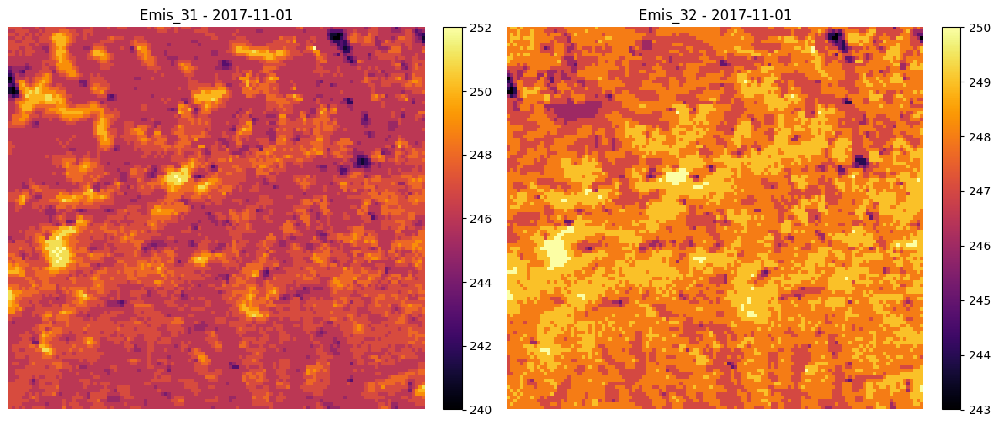

[2/3] Data: 2017-10-24
  → Salvato TIFF con 2 bande in modis_emissivity\fire_5440\2017-10-24_Emis_31_32.tif


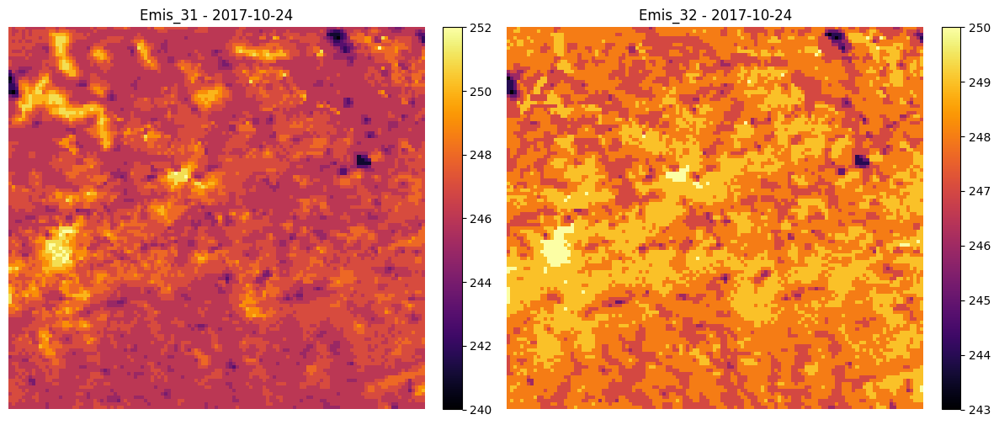

[3/3] Data: 2017-10-16
  → Salvato TIFF con 2 bande in modis_emissivity\fire_5440\2017-10-16_Emis_31_32.tif


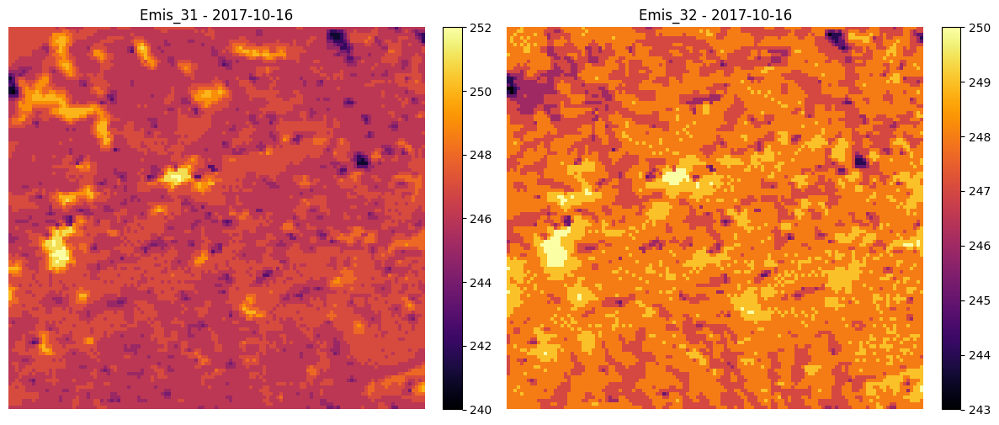

In [7]:
import planetary_computer
import pystac_client
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
from datetime import timedelta
from datetime import datetime
import pandas as pd
import os

# ========== CONFIG ==========
GEOJSON_PATH = "shp_cp_2012_2024/piedmont_2012_2024_fa.geojson"
FIRE_ID = 5440
SAVE_FOLDER = os.path.join("modis_emissivity", f"fire_{FIRE_ID}")
os.makedirs(SAVE_FOLDER, exist_ok=True)

# ========== LOAD FIRE DATA ==========
gdf = gpd.read_file(GEOJSON_PATH)
fire_feature = gdf[gdf["id"] == FIRE_ID].iloc[0]
fire_geometry = fire_feature.geometry
fire_date = pd.to_datetime(fire_feature["initialdate"])

# Reproject geometry to WGS84 and then to MODIS CRS
fire_geometry_4326 = gpd.GeoSeries([fire_geometry], crs=3857).to_crs(4326).iloc[0]
fire_geom_df = gpd.GeoSeries([fire_geometry_4326], crs=4326).to_crs("EPSG:6933")

# BUFFER GRANDE per evitare crop eccessivo (50 km)
fire_geom_buffered = fire_geom_df.buffer(50000)

# Bounding boxes
bbox_4326 = gpd.GeoSeries(fire_geom_buffered.to_crs(4326)).total_bounds.tolist()
bbox_m = fire_geom_buffered.total_bounds.tolist()

print("Bounding box WGS84 (gradi):", bbox_4326)
print("Bounding box MODIS CRS (metri):", bbox_m)

# ========== STAC SEARCH ==========
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace
)
time_range = f"{(fire_date - timedelta(days=3)):%Y-%m-%d}/{(fire_date + timedelta(days=10)):%Y-%m-%d}"

search = catalog.search(
    collections=["modis-11A2-061"],
    bbox=bbox_4326,
    datetime=time_range,
    query={"platform": {"eq": "terra"}}
)

items = list(search.items())
print(f"Trovate {len(items)} immagini:")

# ========== DOWNLOAD, SALVA, PLOT ==========
for i, item in enumerate(items):
    date_str = datetime.fromisoformat(item.properties["start_datetime"]).strftime('%Y-%m-%d')
    print(f"[{i+1}/{len(items)}] Data: {date_str}")

    emis_31_asset = item.assets.get("Emis_31")
    emis_32_asset = item.assets.get("Emis_32")

    if not emis_31_asset or not emis_32_asset:
        print(f"  → Bande mancanti per {date_str}")
        continue

    emis_31_href = planetary_computer.sign(emis_31_asset.href)
    emis_32_href = planetary_computer.sign(emis_32_asset.href)

    with rasterio.open(emis_31_href) as src_31, rasterio.open(emis_32_href) as src_32:
        window = rasterio.windows.from_bounds(*bbox_m, transform=src_31.transform)
        data_31 = src_31.read(1, window=window)
        data_32 = src_32.read(1, window=window)
        out_transform = src_31.window_transform(window)

        # Salva TIFF a 2 bande
        out_path = os.path.join(SAVE_FOLDER, f"{date_str}_Emis_31_32.tif")
        profile = src_31.profile.copy()
        profile.update({
            "count": 2,
            "height": data_31.shape[0],
            "width": data_31.shape[1],
            "transform": out_transform
        })

        with rasterio.open(out_path, "w", **profile) as dst:
            dst.write(data_31, 1)
            dst.write(data_32, 2)
        print(f"  → Salvato TIFF con 2 bande in {out_path}")

        # Plot comparativo
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))
        im1 = axs[0].imshow(data_31, cmap="inferno")
        axs[0].set_title(f"Emis_31 - {date_str}")
        plt.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04)

        im2 = axs[1].imshow(data_32, cmap="inferno")
        axs[1].set_title(f"Emis_32 - {date_str}")
        plt.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04)

        for ax in axs:
            ax.axis("off")

        plt.tight_layout()
        plt.show()


LANDSAT

In [ ]:
import planetary_computer
import pystac_client
import geopandas as gpd
from shapely.geometry import shape
import rasterio
from rasterio.enums import Resampling
import numpy as np
import pandas as pd
import os
from datetime import datetime, timedelta

# ---------------------
# Parametri di input
# ---------------------
GEOJSON_PATH = "shp_cp_2012_2024/piedmont_2012_2024_fa.geojson"
FIRE_ID = 5440
SAVE_FOLDER = os.path.join("landsat_images", f"fire_{FIRE_ID}")
os.makedirs(SAVE_FOLDER, exist_ok=True)

# ---------------------
# Lettura e pre-processing
# ---------------------
gdf = gpd.read_file(GEOJSON_PATH)
fire = gdf[gdf["id"] == FIRE_ID].iloc[0]
fire_date = pd.to_datetime(fire["initialdate"])
fire_geometry = shape(fire["geometry"])
buffer_distance = 0.01  # ~1 km buffer
fire_geometry_buffered = fire_geometry.buffer(buffer_distance)

# CRS conversione a EPSG:4326 se necessario
if gdf.crs and gdf.crs.to_epsg() != 4326:
    gdf = gdf.to_crs(epsg=4326)
    fire_geometry_buffered = (
        gpd.GeoSeries([fire_geometry_buffered], crs="EPSG:3857")
        .to_crs(epsg=4326)
        .iloc[0]
    )
    fire_geometry = (
        gpd.GeoSeries([fire_geometry], crs="EPSG:3857")
        .to_crs(epsg=4326)
        .iloc[0]
    )

# ---------------------
# Apertura del catalogo
# ---------------------
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace
)

# ---------------------
# Intervallo di date
# ---------------------
time_range = f"{fire_date.strftime('%Y-%m-%d')}/{(fire_date + timedelta(days=5)).strftime('%Y-%m-%d')}"
print("Bounding box dell'incendio:", fire_geometry.bounds)
print("Centro approssimato:", fire_geometry.centroid)
print("Data dell'incendio:", fire_date.strftime('%Y-%m-%d'))
print("Intervallo di ricerca:", time_range)

# ---------------------
# Ricerca Landsat C2 L2
# ---------------------
search = catalog.search(
    collections=["landsat-c2-l2"],
    intersects=fire_geometry_buffered,
    datetime=time_range
)

items = list(search.items())

if not items:
    print("Nessuna immagine Landsat trovata per questo incendio.")
else:
    print(f"Trovate {len(items)} immagini Landsat C2 L2.")

    # Definiamo le bande di interesse e le loro risoluzioni tipiche
    bands_of_interest = [
        "coastal", "blue", "green", "red", "nir08",
        "swir16", "swir22", "lwir11", "lwir", "pan",
        "atran", "cdist", "drad", "emis", "emsd", "trad", "urad"
    ]

    landsat_band_resolutions = {
        "blue": 30, "green": 30, "red": 30, "nir08": 30, "swir16": 30, "swir22": 30,
        "lwir11": 30, "lwir": 30, "pan": 15, "coastal": 30, "qa_pixel": 30, "qa_radsat": 30,
        "atran": 30, "cdist": 30, "drad": 30, "emis": 30, "emsd": 30, "trad": 30, "urad": 30
    }

    def resample_to_30m(src, target_resolution=30):
        scale_x = src.transform[0] / target_resolution
        scale_y = -src.transform[4] / target_resolution
        return src.read(
            1,
            resampling=Resampling.bilinear,
            out_shape=(
                int(src.height * scale_y),
                int(src.width * scale_x)
            )
        )

    for i, item in enumerate(items):
        date = item.datetime.strftime('%Y-%m-%d')
        print(f"\nImmagine {i+1}: acquisita il {date}")

        band_arrays_resampled = []
        band_names_resampled = []
        profile = None

        for band in bands_of_interest:
            if band in item.assets:
                signed_href = planetary_computer.sign(item.assets[band]).href
                with rasterio.open(signed_href) as src:
                    native_res = landsat_band_resolutions.get(band, 30)

                    if native_res != 30:
                        band_data = resample_to_30m(src, target_resolution=30)
                    else:
                        band_data = src.read(1).astype(np.float32)
                        if profile is None:
                            profile = src.profile.copy()

                    band_arrays_resampled.append(band_data)
                    band_names_resampled.append(band)
                    print(f"  -> Banda {band} caricata"
                          + (f" e resampling da {native_res}m a 30m." if native_res != 30 else "."))
            else:
                print(f"  -> Banda {band} non disponibile per questo item.")

        if not band_arrays_resampled or profile is None:
            print("Dati insufficienti per costruire il data cube.")
            continue

        profile.update(count=len(band_arrays_resampled))
        data_cube = np.stack(band_arrays_resampled, axis=0)

        cube_path = os.path.join(SAVE_FOLDER, f"fire_{FIRE_ID}_{date}_landsat_allbands_30m.tif")
        with rasterio.open(cube_path, "w", **profile) as dst:
            dst.write(data_cube)
            dst.descriptions = band_names_resampled

        print(f"Data cube Landsat salvato in: {cube_path}")
        print(f"Bande incluse: {', '.join(band_names_resampled)}")


Bounding box dell'incendio: (7.018145062106884, 45.141455285088476, 7.16662078747616, 45.19112210703416)
Centro approssimato: POINT (7.094738178637225 45.16357809084647)
Data dell'incendio: 2017-10-22
Intervallo di ricerca: 2017-10-22/2017-10-27
Trovate 2 immagini Landsat C2 L2.

Immagine 1: acquisita il 2017-10-22
  -> Banda coastal caricata.
  -> Banda blue caricata.
  -> Banda green caricata.
  -> Banda red caricata.
  -> Banda nir08 caricata.
  -> Banda swir16 caricata.
  -> Banda swir22 caricata.
  -> Banda lwir11 caricata.
  -> Banda lwir non disponibile per questo item.
  -> Banda pan non disponibile per questo item.
  -> Banda atran caricata.
  -> Banda cdist caricata.
  -> Banda drad caricata.
  -> Banda emis caricata.
  -> Banda emsd caricata.
  -> Banda trad caricata.
  -> Banda urad caricata.
Data cube Landsat salvato in: landsat_images\fire_5440\fire_5440_2017-10-22_landsat_allbands_30m.tif
Bande incluse: coastal, blue, green, red, nir08, swir16, swir22, lwir11, atran, cdi

Bande disponibili: ('coastal', 'blue', 'green', 'red', 'nir08', 'swir16', 'swir22', 'lwir11', 'atran', 'cdist', 'drad', 'emis', 'emsd', 'trad', 'urad')
Banda red all'indice 4
Banda nir08 all'indice 5
Banda swir22 all'indice 7


(-0.5, 1979.5, 2006.5, -0.5)

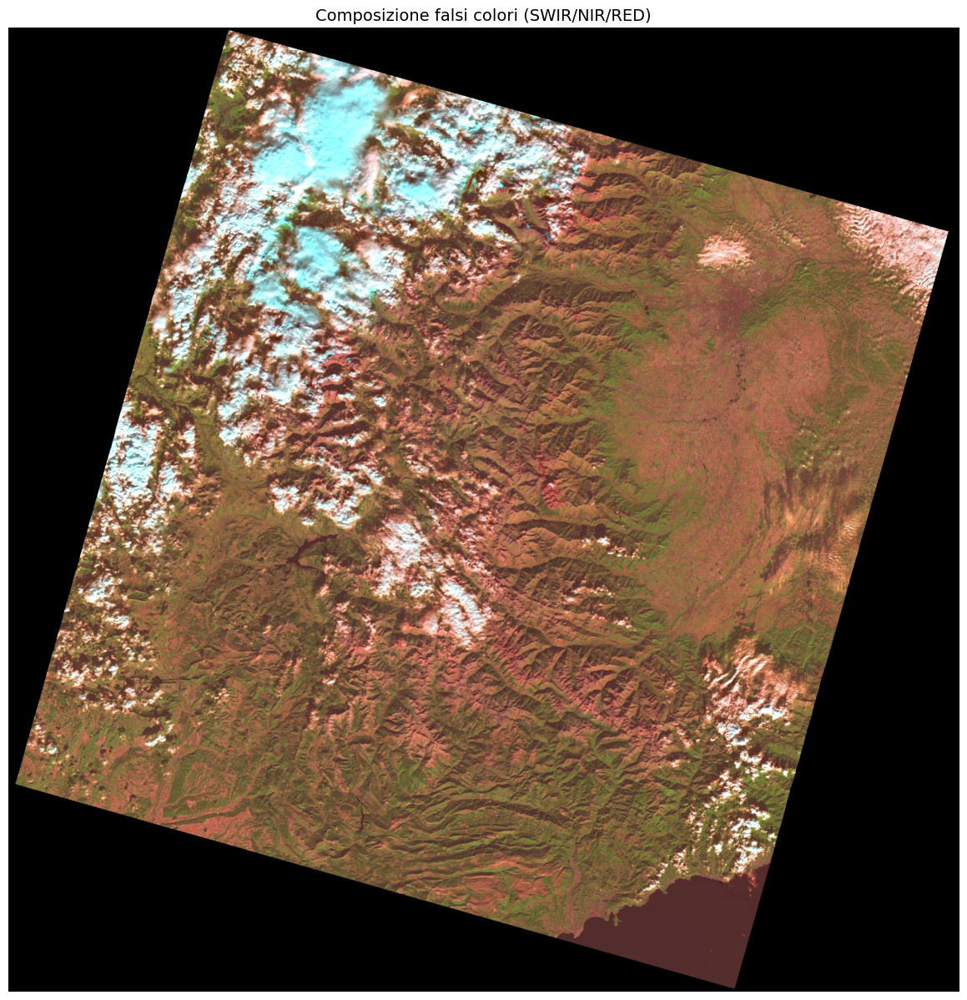

In [4]:
import rasterio
from rasterio.enums import Resampling
import numpy as np
import matplotlib.pyplot as plt
import os

# --------------------------------------------------
# Parametri configurabili
# --------------------------------------------------
SCALE_FACTOR = 4  # Riduzione dimensioni (1 = originale, 4 = 1/4)
TIFF_PATH = "landsat_images/fire_5440/fire_5440_2017-10-22_landsat_allbands_30m.tif"
#OUTPUT_PATH = "fire_5440_RGB_swapped.png"
DPI = 150  # Risoluzione immagine finale

# --------------------------------------------------
# Lettura del data cube con downsampling
# --------------------------------------------------
with rasterio.open(TIFF_PATH) as src:
    # Ottieni dimensioni originali
    height, width = src.shape
    
    # Calcola nuove dimensioni
    new_height = height // SCALE_FACTOR
    new_width = width // SCALE_FACTOR
    
    # Leggi i descrittori delle bande dai metadati
    band_descriptions = src.descriptions
    print("Bande disponibili:", band_descriptions)
    
    # Trova gli indici delle bande che ci interessano (B04, B08, B12)
    red_index = band_descriptions.index("red") + 1  # +1 perché rasterio parte da 1
    nir_index = band_descriptions.index("nir08") + 1
    swir_index = band_descriptions.index("swir22") + 1
    
    print(f"Banda red all'indice {red_index}")
    print(f"Banda nir08 all'indice {nir_index}")
    print(f"Banda swir22 all'indice {swir_index}")
    
    # Leggi le bande con downsampling                  
    redBand = src.read(red_index, out_shape=(new_height, new_width), resampling=Resampling.bilinear)
    nirBand = src.read(nir_index, out_shape=(new_height, new_width), resampling=Resampling.bilinear)
    swirBand = src.read(swir_index, out_shape=(new_height, new_width), resampling=Resampling.bilinear)

# --------------------------------------------------
# Normalizzazione delle bande
# --------------------------------------------------
def normalize_band(band):
    vmin = np.nanpercentile(band, 2)  # Taglia il 2% inferiore
    vmax = np.nanpercentile(band, 98)  # Taglia il 2% superiore
    band_norm = np.clip((band - vmin) / (vmax - vmin), 0, 1)
    return (band_norm * 255).astype(np.uint8)  # Converti in uint8

# Composizione RGB "swappata" (false color)
red = normalize_band(swirBand)    # B12 → Rosso (SWIR)
green = normalize_band(nirBand)  # B08 → Verde (NIR)
blue = normalize_band(redBand)   # B04 → Blu (Rosso)

# --------------------------------------------------
# Creazione e salvataggio RGB
# --------------------------------------------------
rgb_image = np.dstack((red, green, blue))

plt.figure(figsize=(15, 15))
plt.imshow(rgb_image)
plt.title("Composizione falsi colori (SWIR/NIR/RED)", fontsize=14)
plt.axis("off")


SENTINEL PROVA RGB
R--->12
G--->8
B--->4

prendi tutte

modis emissivity 8 days
band 31 e band32

landsat
da red a coastal
temperatura da example notebook
come sentinel
R --->swir22
G --->nir08
B --->red

CORSICA e SICILIA fai stagionalità